# Stochastic stranding
__Суммарное количество баллов: 8__

__Решение отправлять на `ml.course.practice@gmail.com`__

__Тема письма: `[ML][HW11] <ФИ>`, где вместо `<ФИ>` указаны фамилия и имя__

По бескрайним каменным джунглям от заказа к заказу бродят курьеры. Их задача - как можно быстрее доставить все заказы, чтобы взять новые. Ничто не может заставить их покинуть вечный цикл доставки.

In [1]:
import random
from itertools import combinations
from typing import Callable, Tuple, List

import matplotlib.pyplot as plt
import numpy as np
from IPython.display import HTML
from matplotlib import animation

In [2]:
SEED = 7
np.random.seed(SEED)
random.seed(SEED)

In [3]:
def get_colors(distances, alpha=True):
    normed = np.array(distances) - np.min(distances)
    normed = normed / np.max(normed)
    alpha = 1/np.mean([len(row) for row in normed])**0.5 if alpha else 1.
    return [[((1. if n > 0.5 else 2 * n), (1. if n < 0.5 else 2 - 2*n), 0., alpha) 
             for n in row] for row in normed]

def get_coords(points):
    results = []
    for pts in points:
        x_prev, _ = pts[0]
        result = [pts[0]]
        for x, y in list(pts[1:]) + [pts[0]]:
            result.append((x_prev, y))
            result.append((x, y))
            x_prev = x
        results.append(list(zip(*result)))
    return results

def init_figure(X):
    upper_bound, lower_bound = X.max(axis=0) + 1, X.min(axis=0) - 1
    fig, ax = plt.subplots(figsize=(10, 10), nrows=1, ncols=1)
    #ax.set_facecolor((0.1, 0.1, 0.1))
    ax.grid(True)
    #ax.grid(True, color=(0.9, 0.9, 0.9))
    ax.set_xticks(range(lower_bound[0], upper_bound[0]))
    ax.set_yticks(range(lower_bound[1], upper_bound[1]))
    ax.set_xlim(lower_bound[0], upper_bound[0])
    ax.set_ylim(lower_bound[1], upper_bound[1])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.scatter(X[:, 0], X[:, 1], color=(0, 0, 1))
    plt.tight_layout()
    return fig, ax    

def visualize_hillclimb(X, hillclimb):
    fig, ax = init_figure(X)
    permutations = hillclimb.optimize_explain(X)
    # colors = get_colors([[cyclic_distance(X[p], hillclimb.dist) for p in permutations]], False)[0]
    # coords = get_coords([X[p] for p in permutations])
    colors = get_colors([[cyclic_distance(p, hillclimb.dist) for p in permutations]], False)[0]
    coords = get_coords([p for p in permutations])
    plot = ax.plot(coords[0][0], coords[0][1], color=colors[0])[0]
    
    def animate(i):
        plot.set_color(colors[i])
        plot.set_data(*coords[i])
        return (plot,)
    
    return animation.FuncAnimation(fig, animate, frames=len(permutations), interval=100, blit=True)

def visualize_genetic(X, genetic):
    fig, ax = init_figure(X)
    populations = genetic.optimize_explain(X)
    distances = [[cyclic_distance(X[p], genetic.dist) for p in populations[i]] for i in range(len(populations))]
    colors = get_colors(distances)
    coords = get_coords([X[p] for p in populations[0]])
    plots = [ax.plot(x, y, color=c)[0] for (x, y), c in zip(coords, colors[0])]
    best_id = np.argmin(distances[0])
    best_plot = ax.plot(*coords[best_id], color=(0.3, 0.3, 1, 0.9), linestyle="-.")[0]
    
    def animate(i):
        coords = get_coords([X[p] for p in populations[i]])
        for p, (x, y), c in zip(plots, coords, colors[i]):
            p.set_color(c)
            p.set_data(x, y)
        best_id = np.argmin(distances[i])
        best_plot.set_data(*coords[best_id])
        return plots + [best_plot]
    
    return animation.FuncAnimation(fig, animate, frames=len(populations), interval=100, blit=True)

In [4]:
def synthetic_points(count=25, dims=2):
    return np.random.randint(40, size=(count, dims))

X = synthetic_points()

### Задание 1 (1 балл)
Для начала научимся считать расстояния, которые курьерам придется преодолеть. Если бы они доставляли еду в пустыне, то им бы было достаточно считать евклидовы расстояния, т.к. можно просто идти напрямик. Однако курьеры доставляют еду только в городе, и двигаться могут только вдоль улиц. Поэтому нам понадобится манъэттенское расстояние.

#### Функции
`cyclic_distance(points, dist)` - возвращает суммарное расстояние пройденное курьером по циклу из точек `points` посчитанное при помощи функции `dist`.

`l2_distance(p1, p2)` - возвраает евклидово расстояние между точками.

`l1_distance(p1, p2)` - возвращает манхэттенское расстояние между точками.

In [5]:
def cyclic_distance(points: np.ndarray, dist: Callable) -> float:
    points_to = np.roll(points, 1, axis=0)
    return dist(points, points_to).sum()

def l2_distance(p1: np.ndarray, p2: np.ndarray) -> float:
    diff = p1 - p2
    return np.sqrt(diff.dot(diff))

def l1_distance(p1: np.ndarray, p2: np.ndarray) -> float:
    return np.sum(np.abs(p2 - p1))

### Задание 2 (3 балла)
Курьер получил карту расположения заказов на карте. Ему хочется побыстрее обойти все точки. Для этого он хочет воспользоваться методом HillClimb, а вам предстоит ему в этом помочь. Реализуйте данный метод.

#### Методы
`optimize_explain(X)` - возвращает список из перестановок точек `X`, полученных в процессе оптимизации. Перестановка должна попадать в список после каждого изменения. Метод должен совершить не больше `max_iterations` итераций, на каждой из них необходимо рассмотреть все возможные пары индексов.

#### Параметры конструктора
`max_iterations` - максимальное количество итераций в методе `optimize_explain`

`dist` - функция расстояния

In [6]:
class HillClimb:
    def __init__(self, max_iterations, dist):
        self.max_iterations = max_iterations
        self.dist = dist # Do not change
    
    def optimize(self, points) -> np.ndarray:
        return self.optimize_explain(points)[-1]
    
    def optimize_explain(self, points: np.ndarray) -> List[np.ndarray]:
        points = points.copy()
        permutations = []

        cur_dist = cyclic_distance(points, self.dist)
        for i in range(self.max_iterations):
            (i, j), new_dist = self._get_swap(points, cur_dist)
            if new_dist is None:
                break
            points[[i, j]] = points[[j, i]]
            permutations.append(points.copy())
            cur_dist = new_dist
        print(f"best score: {cur_dist}")
        return permutations

    def _get_swap(self, points: np.ndarray, cur_dist: float) -> Tuple[Tuple[int, int], float]:
        n_points = points.shape[0]
        best_swap, best_dist = None, None
        for i, j in combinations(range(n_points), 2):
            if i >= j:
                continue
            if i == 0 and j == n_points - 1:
                i, j = j, i

            old_dists = self.dist(points[i], points[(i - 1 + n_points) % n_points]) +\
                self.dist(points[j], points[(j + 1) % n_points])
            new_dists = self.dist(points[i], points[(j + 1) % n_points]) +\
                self.dist(points[j], points[(i - 1 + n_points) % n_points])

            if (j - i + n_points) % n_points > 1:
                old_dists += self.dist(points[i], points[(i + 1) % n_points]) +\
                    self.dist(points[j], points[(j - 1 + n_points) % n_points])
                new_dists += self.dist(points[i], points[(j - 1 + n_points) % n_points]) +\
                                self.dist(points[j], points[(i + 1) % n_points])

            full_dist = cur_dist - old_dists + new_dists
            if best_dist is None or best_dist > full_dist:
                best_swap, best_dist = (i, j), full_dist

        return best_swap, best_dist

best score: 282


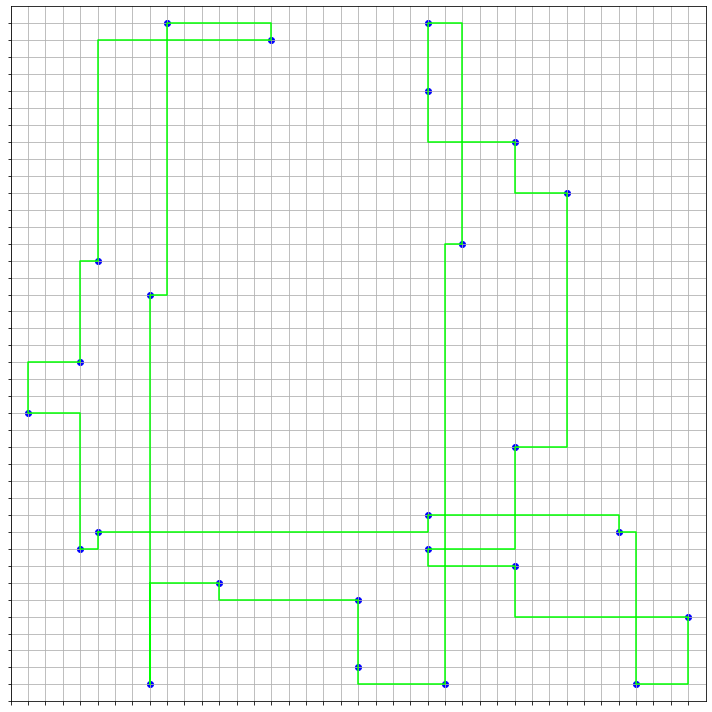

In [7]:
hc = HillClimb(100, l1_distance)
HTML(visualize_hillclimb(X, hc).to_jshtml())

### Задание 3 (4 балла)
Курьерское дело растет, теперь между городами блуждает большое количество курьеров, а их профессия вместе с известным маршрутом передается из поколение в поколение. Чем быстрее курьер способен обойти города - тем больше вероятность того, что он заработает себе на безоблачную старость и передаст свое дело потомкам. Симулируйте эволюцию курьеров, реализовав генетический алгоритм.

#### Методы
`optimize(X)` - выбирает лучшую перестановку из результатов `optimize_explain(X)`

`optimize_explain(X)` - возвращает список длины `iterations` популяций размера `population` перестановок точек `X`, полученных в процессе оптимизации. На каждом шаге алгоритм должен оставлять только `survivors` выживших, следующая популяция должна быть сгенерирована из них

In [8]:
class Genetic:
    def __init__(self, iterations, population, survivors, distance):
        self.pop_size = population
        self.surv_size = survivors
        self.dist = distance
        self.iters = iterations
        self._die_size = self.pop_size - self.surv_size

    def optimize(self, points: np.ndarray) -> np.ndarray:
        return self.optimize_explain(points)[-1]

    def optimize_explain(self, points: np.ndarray) -> List[np.ndarray]:
        n_points = points.shape[0]
        population = [np.random.choice(n_points, n_points, replace=False) for _ in range(self.pop_size)]
        population = np.vstack(population)

        history = []

        best_score = None
        for i in range(self.iters):
            scores = self.fitness(points, population)
            survived = population[np.argsort(scores)[:self.surv_size]]
            population = self.crossover(survived)
            cur_score = np.min(scores)
            best_score = cur_score if best_score is None else min(best_score, cur_score)

            history.append(population.copy())
        print(f"best score: {best_score}")
        return history

    def fitness(self, points: np.ndarray, population: np.ndarray) -> List[float]:
        return [cyclic_distance(points[p], self.dist) for p in population]

    def crossover(self, survived: np.ndarray) -> np.ndarray:
        n_points = survived.shape[1]
        new_population = np.empty((self.pop_size, n_points), dtype=np.int32)
        new_population[:self.surv_size] = survived
        crossover_parts = np.random.randint(n_points, size=(self._die_size, 2))

        for idx, (i, j) in enumerate(crossover_parts):
            if i > j:
                i, j = j, i
            parent1, parent2 = random.randint(0, self.surv_size - 1), random.randint(0, self.surv_size - 1)

            parent1_children = survived[parent1, i:j]
            new_population[idx + self.surv_size, :(j - i)] = parent1_children
            new_population[idx + self.surv_size, (j - i):] = [p for p in survived[parent2] if p not in parent1_children]

        return self.mutate(new_population, n_points)

    @staticmethod
    def mutate(populations: np.ndarray, n_points: int, p: float = 0.25) -> np.ndarray:
        for population in populations:
            if random.random() < p:
                i, j = random.randint(0, n_points - 1), random.randint(0, n_points - 1)
                population[[i, j]] = population[[j, i]]

        return populations

best score: 222


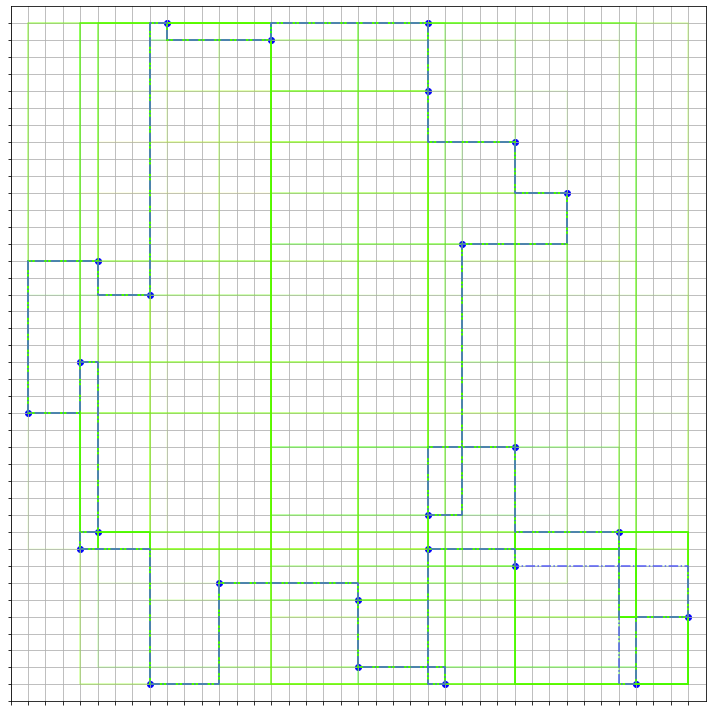

In [9]:
gen = Genetic(200, 100, 20, l1_distance)
HTML(visualize_genetic(X, gen).to_jshtml())